In [1]:
import IJulia

# The julia kernel has built in support for Revise.jl, so this is the 
# recommended approach for long-running sessions:
# https://github.com/JuliaLang/IJulia.jl/blob/9b10fa9b879574bbf720f5285029e07758e50a5e/src/kernel.jl#L46-L51

# Users should enable revise within .julia/config/startup_ijulia.jl:
# https://timholy.github.io/Revise.jl/stable/config/#Using-Revise-automatically-within-Jupyter/IJulia-1

# clear console history
IJulia.clear_history()

fig_width = 6
fig_height = 4
fig_format = :retina
fig_dpi = 96

# no retina format type, use svg for high quality type/marks
if fig_format == :retina
  fig_format = :svg
elseif fig_format == :pdf
  fig_dpi = 96
  # Enable PDF support for IJulia
  IJulia.register_mime(MIME("application/pdf"))
end

# convert inches to pixels
fig_width = fig_width * fig_dpi
fig_height = fig_height * fig_dpi

# Intialize Plots w/ default fig width/height
try
  import Plots

  # Plots.jl doesn't support PDF output for versions < 1.28.1
  # so use png (if the DPI remains the default of 300 then set to 96)
  if (Plots._current_plots_version < v"1.28.1") & (fig_format == :pdf)
    Plots.gr(size=(fig_width, fig_height), fmt = :png, dpi = fig_dpi)
  else
    Plots.gr(size=(fig_width, fig_height), fmt = fig_format, dpi = fig_dpi)
  end
catch e
  # @warn "Plots init" exception=(e, catch_backtrace())
end

# Initialize CairoMakie with default fig width/height
try
  import CairoMakie

  # CairoMakie's display() in PDF format opens an interactive window
  # instead of saving to the ipynb file, so we don't do that.
  # https://github.com/quarto-dev/quarto-cli/issues/7548
  if fig_format == :pdf
    CairoMakie.activate!(type = "png")
  else
    CairoMakie.activate!(type = string(fig_format))
  end
  CairoMakie.update_theme!(resolution=(fig_width, fig_height))
catch e
    # @warn "CairoMakie init" exception=(e, catch_backtrace())
end
  
# Set run_path if specified
try
  run_path = raw"/Users/hirofumi48/162348.github.io/posts/2024/Process"
  if !isempty(run_path)
    cd(run_path)
  end
catch e
  @warn "Run path init:" exception=(e, catch_backtrace())
end


# emulate old Pkg.installed beahvior, see
# https://discourse.julialang.org/t/how-to-use-pkg-dependencies-instead-of-pkg-installed/36416/9
import Pkg
function isinstalled(pkg::String)
  any(x -> x.name == pkg && x.is_direct_dep, values(Pkg.dependencies()))
end

# ojs_define
if isinstalled("JSON") && isinstalled("DataFrames")
  import JSON, DataFrames
  global function ojs_define(; kwargs...)
    convert(x) = x
    convert(x::DataFrames.AbstractDataFrame) = Tables.rows(x)
    content = Dict("contents" => [Dict("name" => k, "value" => convert(v)) for (k, v) in kwargs])
    tag = "<script type='ojs-define'>$(JSON.json(content))</script>"
    IJulia.display(MIME("text/html"), tag)
  end
elseif isinstalled("JSON")
  import JSON
  global function ojs_define(; kwargs...)
    content = Dict("contents" => [Dict("name" => k, "value" => v) for (k, v) in kwargs])
    tag = "<script type='ojs-define'>$(JSON.json(content))</script>"
    IJulia.display(MIME("text/html"), tag)
  end
else
  global function ojs_define(; kwargs...)
    @warn "JSON package not available. Please install the JSON.jl package to use ojs_define."
  end
end


# don't return kernel dependencies (b/c Revise should take care of dependencies)
nothing


In [2]:
#| output: false
#| echo: false
using Plots

function plot_2dtraj(traj; title="ZigZag Sampler", save=false, savetitle="ZigZag_2D")
    # trajからx座標とy座標を抽出
    x_coords = [state[1] for (t, state) in traj]
    y_coords = [state[2] for (t, state) in traj]

    # 軌跡のプロット
    p = plot(x_coords, y_coords, 
             label="ZigZag trajectory",
             title=title,
             xlabel="X",
             ylabel="Y",
             linewidth=2,
             marker=:circle,
             markersize=2,
             markeralpha=0.6,
             color="#80c4ac")

    # 開始点と終了点をマーク
    Plots.scatter!([x_coords[1]], [y_coords[1]], label="Start", color=:green, markersize=6)
    Plots.scatter!([x_coords[end]], [y_coords[end]], label="End", color=:red, markersize=6)

    # プロットを表示
    display(p)

    if save
        savefig(p, savetitle * ".svg")
    end
    
end

function plot_1dtraj(traj; title="ZigZag Sampler", markersize=2, save=false, savetitle="ZigZag_1D")
    times = [t for (t, state) in traj]
    positions = [state[1] for (t, state) in traj]

    # 軌跡のプロット
    p = plot(times, positions,
             label="ZigZag trajectory",
             title=title,
             xlabel="t",
             ylabel="X",
             linewidth=2,
             marker=:circle,
             markersize=markersize,
             markeralpha=0.6,
             color="#80c4ac")

    # プロットを表示
    display(p)

    if save
        savefig(p, savetitle * ".svg")
    end
end

plot_1dtraj (generic function with 1 method)

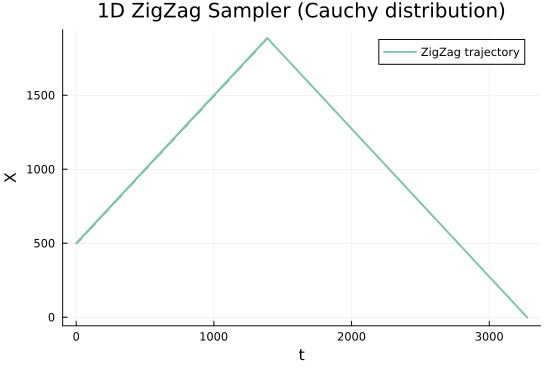

In [3]:
#| code-fold: true
#| fig-cap: "\rC(0,1) に対する ZigZag サンプラーの軌道"
using ZigZagBoomerang
using LinearAlgebra
using SparseArrays
using Plots
using Random

Random.seed!(1234)

# Cauchy分布のポテンシャル関数
ϕ(x) = log(1 + x[1]^2)

# ポテンシャル関数の勾配
∇ϕ(x, i, Γ) = 2x[i] / (1 + x[i]^2)

# 初期値
t0 = 0.0
x0 = [500.0]
θ0 = [1.0]

# ZigZag過程のパラメータ
T = 2000.0  # 総シミュレーション時間

# スパース精度行列（1次元の場合は1x1行列）
Γ = sparse([1], [1], [1.0], 1, 1)

# ZigZag過程の設定
Z = ZigZag(Γ, zeros(1))

# リジェクションバウンド（必要に応じて調整）
c = [1.0]

# ZigZag過程の実行
trace, (tT, xT, θT), (acc, num) = ZigZagBoomerang.spdmp(∇ϕ, t0, x0, θ0, T, c, Z, Γ; adapt=false)

# 軌跡の離散化とサンプリング
dt = 0.1
traj = collect(ZigZagBoomerang.discretize(trace, dt))

# サンプルの表示

plot_1dtraj(traj, title="1D ZigZag Sampler (Cauchy distribution)", markersize=0)

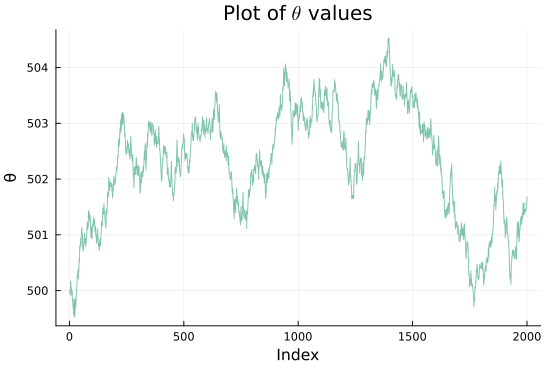

In [4]:
#| code-fold: true
#| fig-cap: "\rC(0,1) に対する MALA サンプラーの軌道"
using AdvancedHMC, AdvancedMH, ForwardDiff
using LinearAlgebra
using LogDensityProblems
using LogDensityProblemsAD
using StructArrays
using Distributions

# Define the target distribution (1D Cauchy) using the `LogDensityProblem` interface
struct LogTargetDensityCauchy
    loc::Float64
    scale::Float64
end

LogDensityProblems.logdensity(p::LogTargetDensityCauchy, θ) = -log(π) - log(p.scale) - log(1 + ((θ[1] - p.loc)/p.scale)^2)
LogDensityProblems.dimension(p::LogTargetDensityCauchy) = 1
LogDensityProblems.capabilities(::Type{LogTargetDensityCauchy}) = LogDensityProblems.LogDensityOrder{0}()

# Choose initial parameter value for 1D
initial_θ = [500.0]

# Use automatic differentiation to compute gradients
model_with_ad = LogDensityProblemsAD.ADgradient(Val(:ForwardDiff), LogTargetDensityCauchy(0.0, 1.0))

# Set up the sampler with a multivariate Gaussian proposal.
σ² = 0.01
spl = MALA(x -> MvNormal((σ² / 2) .* x, σ² * I))

# Sample from the posterior.
chain = sample(model_with_ad, spl, 2000; initial_params=initial_θ, chain_type=StructArray, param_names=["θ"])

# plot
θ_vector = chain.θ
plot(θ_vector, title="Plot of \$\\theta\$ values", xlabel="Index", ylabel="θ", legend=false, color="#80c4ac")

┌ Info: Finished 200 sampling steps for 1 chains in 0.08617325 (s)
│   h = Hamiltonian(metric=DiagEuclideanMetric([1.0]), kinetic=GaussianKinetic())
│   κ = HMCKernel{AdvancedHMC.FullMomentumRefreshment, Trajectory{MultinomialTS, Leapfrog{Float64}, GeneralisedNoUTurn{Float64}}}(AdvancedHMC.FullMomentumRefreshment(), Trajectory{MultinomialTS}(integrator=Leapfrog(ϵ=666.0), tc=GeneralisedNoUTurn{Float64}(10, 1000.0)))
│   EBFMI_est = 0.23182236126769368
└   average_acceptance_rate = 0.17160446586729422


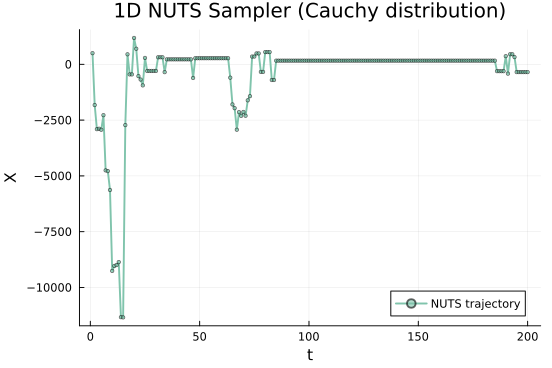

In [5]:
#| echo: false
#| fig-cap: "\rC(0,1) に対する NUTS サンプラーの軌道"

# Define the Cauchy distribution with location and scale
loc, scale = 0.0, 1.0
ℓπ = LogTargetDensityCauchy(loc, scale)

# Set the number of samples to draw and warmup iterations
n_samples, n_adapts = 200, 0

# Define a Hamiltonian system
metric = DiagEuclideanMetric(1)
hamiltonian = Hamiltonian(metric, ℓπ, ForwardDiff)

# Define a leapfrog solver, with the initial step size chosen heuristically
initial_ϵ = find_good_stepsize(hamiltonian, initial_θ)
integrator = Leapfrog(initial_ϵ)

# Define an HMC sampler with the following components
#   - multinomial sampling scheme,
#   - generalised No-U-Turn criteria, and
#   - windowed adaption for step-size and diagonal mass matrix
kernel = HMCKernel(Trajectory{MultinomialTS}(integrator, GeneralisedNoUTurn()))
adaptor = StanHMCAdaptor(MassMatrixAdaptor(metric), StepSizeAdaptor(0.8, integrator))

# Run the sampler to draw samples from the specified Cauchy distribution, where
#   - `samples` will store the samples
#   - `stats` will store diagnostic statistics for each sample
samples, stats = sample(hamiltonian, kernel, initial_θ, n_samples, adaptor, n_adapts; progress=true)

# Print the results
using Plots

sample_values = [s[1] for s in samples]

p = plot(1:length(samples), sample_values,
             label="NUTS trajectory",
             title="1D NUTS Sampler (Cauchy distribution)",
             xlabel="t",
             ylabel="X",
             linewidth=2,
             marker=:circle,
             markersize=2,
             markeralpha=0.6,
             color="#80c4ac")

In [6]:
#| code-fold: true
using ZigZagBoomerang, Distributions, ForwardDiff, LinearAlgebra, SparseArrays, StructArrays
const ZZB = ZigZagBoomerang
## Problem
d = 2
n = 10
xtrue = [-3.0, 3.0]
data = rand(Normal(xtrue[1], xtrue[2]), n)
g(x) = sum(logpdf(Normal(x[1], x[2]), dt) for dt in data) 

## Negative partial derivative maker
function negpartiali(f, d)
   id = collect(I(d))
   ith = [id[:,i] for i in 1:d]
   function (x, i, args...)
       sa = StructArray{ForwardDiff.Dual{}}((x, ith[i]))
       δ = -f(sa, args...).partials[]
       return δ
   end
end

## Sampler

# Starting point
t0 = 0.0
x0 = [2.0, 5.0]
θ0 = rand([-1.0,1.0], d)
u0 = ZZB.stickystate(x0)

# Dynamics
Z = ZigZag(sparse(I(n)), x0*0);
flow = ZZB.StickyFlow(Z)

# Duration
T = 2000.0
end_time = ZZB.EndTime(T)


# Target 
G = [i=>collect(1:d) for i in 1:d] # Sparsity target (full)
target = ZZB.StructuredTarget(G, negpartiali(g, d))

# Barriers
c = 1.0*ones(length(x0))
κ = Inf # Inverse waiting time
barriers = [ZZB.StickyBarriers(), # No barrier
            ZZB.StickyBarriers((2.5, Inf), (:reflect, :reflect), (κ, κ)) # instantaneously reflect at 0 and at "infinity"
   ]

# Rejection bounds
strong = false
c = 20*[1.0 for i in 1:d]
adapt = true # adapt bounds
multiplier = 1.5
G1 = [i => [i] for i in 1:d] # Sparsity pattern bounds (diagonal)
upper_bounds = ZZB.StickyUpperBounds(G, G1, 1.0sparse(I(d)), c; adapt=adapt, strong=strong, multiplier= multiplier)
  
# Sample
zigzag_trace, _, _, acc = @time ZZB.stickyzz(u0, target, flow, upper_bounds, barriers, end_time)
println("acc ", acc.acc/acc.num)

# Discretize on dynamic grid for plotting
@time ts1, xs1 = ZZB.sep(collect(zigzag_trace))

# Discretize on fixed grid for means
dt = 0.5
ts, xs = ZZB.sep(collect(discretize(zigzag_trace, dt)))
@show mean(xs)


# Visualize
using GLMakie
fig1 = fig = Figure()
r = 1:length(ts1)
ax = Axis(fig[1,1], title = "zigzag_trace 1")
lines!(ax, ts1[r], getindex.(xs1[r], 1))
ax = Axis(fig[2,1], title = "zigzag_trace 2")
lines!(ax, ts1[r], getindex.(xs1[r], 2))

ax = Axis(fig[1:2,2], title = "phase")
lines!(ax, getindex.(xs1[r], 1), getindex.(xs1[r], 2))

# display(fig1)

  0.164907 seconds (1.22 M allocations: 40.842 MiB, 6.40% gc time, 75.11% compilation time)
acc 0.018217419322857285
  0.000110 seconds (3.71 k allocations: 347.172 KiB)
mean(xs) = [-1.5457866899657495, 4.003709700313071]


Lines{Tuple{Vector{Point{2, Float64}}}}

In [7]:
using ZigZagBoomerang
using SparseArrays

d = 2

# 対数尤度関数 ϕ の第 i 成分に関する微分を計算
Γ = sparse([1,1,2,2], [1,2,1,2], [2.0,-1.0,-1.0,2.0])  # <1>
∇ϕ(x, i, Γ) = ZigZagBoomerang.idot(Γ, i, x)  # <2>

# 初期値
t0 = 0.0
x0 = randn(d)
θ0 = rand([-1.0,1.0], d)

# Rejection bounds
c = 1.0 * ones(length(x0))

# ZigZag 過程をインスタンス化
Z = ZigZag(Γ, x0*0)

# シミュレーション実行
T = 20.0
@time zigzag_trace, (tT, xT, θT), (acc, num) = spdmp(∇ϕ, t0, x0, θ0, T, c, Z, Γ; adapt=true)

# 軌跡を離散化
@time traj = collect(discretize(zigzag_trace, 0.1))

# 結果の表示
println("Final state: ", xT)
println("Trajectory length: ", length(traj))

  0.059541 seconds (64.06 k allocations: 3.887 MiB, 99.74% compilation time: 100% of which was recompilation)
  0.000017 seconds (420 allocations: 44.109 KiB)
Final state: [-1.0403644187275156, -0.8780266826275596]
Trajectory length: 206


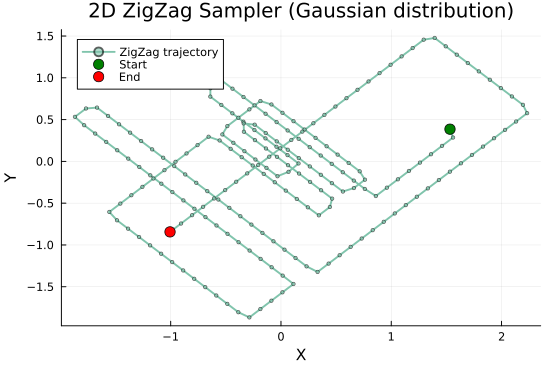

In [8]:
#| echo: false

plot_2dtraj(traj, title="2D ZigZag Sampler (Gaussian distribution)")